In [1]:
import numpy as np
import pandas
import networkx as nx
import matplotlib.pyplot as plt
import os

In [2]:
import griottes
import griottes.analyse

from griottes.graphmaker import make_spheroids
from griottes.graphmaker import graph_generation_func

In [3]:
FPATH = r'Y:\Valentin\Images_saucisson'
image_2_frame = pandas.read_csv(os.path.join(FPATH, '220325_1/220325_1_labeled_NN_classified_220517.csv'))

descriptors = ['label', 'cell_type', 'color', 'legend','cell_properties','x', 'y']
n_colors = len(image_2_frame.cell_type.unique())
color_list = [plt.cm.Set2(i) for i in range(n_colors)]
colors = [color_list[image_2_frame.loc[i, 'cell_type']] for i in range(len(image_2_frame))]
image_2_frame['color'] = colors
image_2_frame['z'] = 0

G = graph_generation_func.generate_delaunay_graph(image_2_frame,
                                                  image_is_2D = True,
                                                  descriptors = descriptors,
                                                  distance = 60)

In [4]:
graphplot.scatter_plot_2D(G, 
                scatterpoint_size = 6,
                legend = True,    
                figsize = (6,6))

NameError: name 'graphplot' is not defined

In [4]:
from coloriage import coloriage

In [6]:
def categorical_vector(G, category):
    
    cat = nx.get_node_attributes(G, category)
    type_of_data = type(cat[min(cat)])
    V = np.array(list(cat.items()), dtype=type_of_data)
    a = map(int, V[:,0])
    a = np.array(list(a))
    ind = np.argsort(a)
    Vect = V[:,1][ind]
    
    return Vect

In [18]:
from bokeh.plotting import figure
from bokeh.models import CustomJS, ColumnDataSource
from bokeh.layouts import grid
from bokeh.io import output_notebook  # prevent opening separate tab with graph
from bokeh.io import show
from bokeh.layouts import row
from bokeh.layouts import grid
from bokeh.models import CustomJS, ColumnDataSource
from bokeh.models import Button  # for saving data
from bokeh.events import ButtonClick  # for saving data
from bokeh.models.widgets import DataTable, DateFormatter, TableColumn
from bokeh.models import HoverTool
from bokeh.plotting import figure

In [32]:
x = list(categorical_vector(G, 'x'))
y = list(categorical_vector(G, 'y'))
color = list(categorical_vector(G, 'color'))
cellLabels = list(categorical_vector(G, 'label'))

# create first subplot
s1 = ColumnDataSource(data=dict(x=x, 
                                y=y, 
                                color = ['b'],
                                label = cellLabels))

In [33]:
fig01 = figure(
        width=500,
        height=500,
        tools=["lasso_select", "reset", "save"],
        title="Select Here",
    )
fig01.circle("x", "y", color = "color", alpha=0.8, source=s1)

#layout = grid([fig01, table, savebutton], ncols=3)
layout = grid([fig01], ncols=1)

output_notebook()
show(layout)

Loading BokehJS ...

In [5]:
coloriage.make_interactive_plot(G, plot_width = 1000, plot_height = 1000)

Loading BokehJS ...

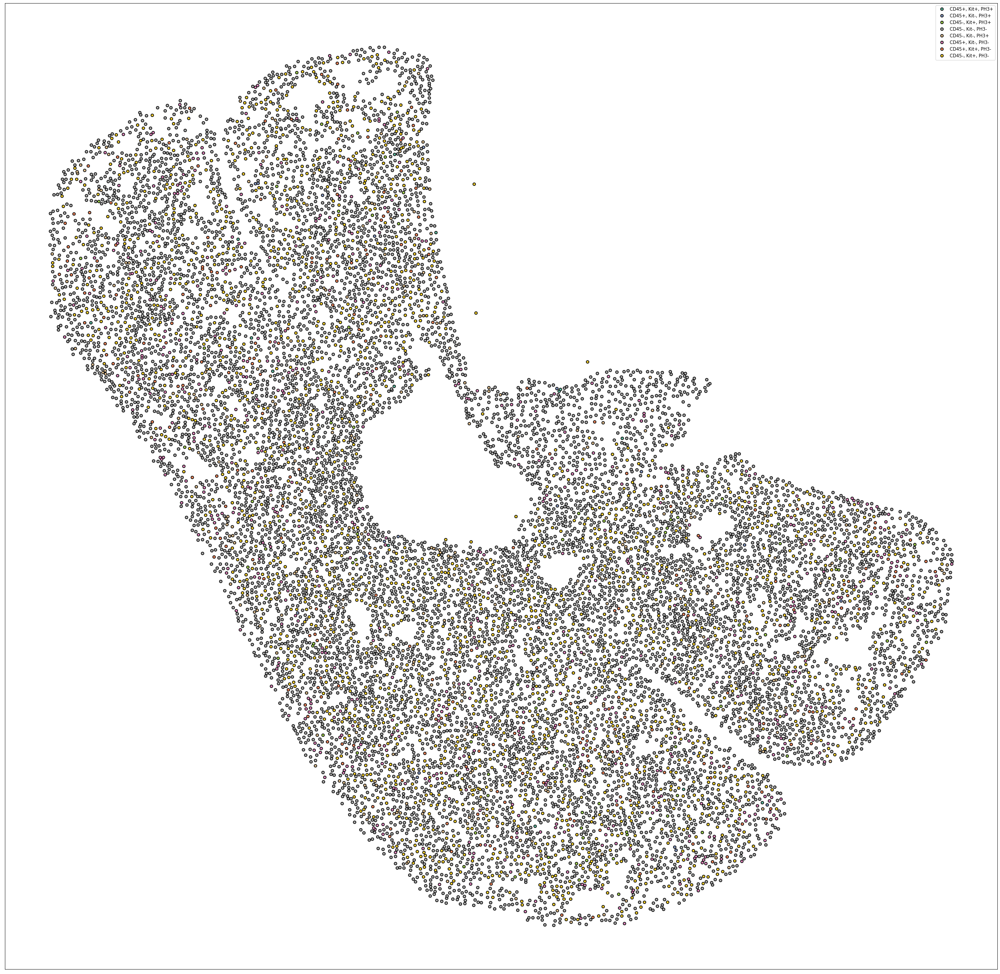

In [25]:
graphplot.scatter_plot_2D(G, 
                scatterpoint_size = 6,
                legend = True,    
                figsize = (40,40))
plt.savefig('graph_220407_1_2D.pdf')

In [14]:
def basic_graph(G,
                background_image = None,
                figsize:tuple = (8,8),
                alpha_line = 0.6,
                scatterpoint_size = 20,
                legend = False,
               color_lines = 'k',
               invert_axis = False):

    # Get node positions
    X = nx.get_node_attributes(G, 'x')
    Y = nx.get_node_attributes(G, 'y')
    
    pos = nx.get_node_attributes(G, 'pos')

    # Define color range proportional to number of edges adjacent to a single node
    colors = nx.get_node_attributes(G, 'color')

    if legend:

        legend = nx.get_node_attributes(G, 'legend')

    fig, ax = plt.subplots(figsize = figsize)

    #plt.imshow(background_image, cmap = 'gray')

    # Loop on the pos dictionary to extract the x,y,z coordinates of each node

    for i,j in enumerate(G.edges()):

        x = np.array((X[j[0]], X[j[1]]))
        y = np.array((Y[j[0]], Y[j[1]]))

    # Loop on the pos dictionary to extract the x,y,z coordinates of each node
        
        # Plot the connecting lines
        if invert_axis:
            plt.plot(y, x, c = color_lines, alpha = alpha_line, linewidth = 1)
        else:
            plt.plot(y, x, c = color_lines, alpha = alpha_line, linewidth = 1)

    x = []
    y = []
    nodeColor = []
    s = []
    nodelegend = []

    for key, value in pos.items():
        x.append(value[1])
        y.append(value[2])
        s.append(scatterpoint_size)
        nodeColor.append(colors[key])

        if legend:
              nodelegend.append(legend[key])

    df = pandas.DataFrame()
    df['x'] = x
    df['y'] = y
    df['s'] = s
    df['nodeColor'] = nodeColor

    if legend:
          df['legend'] = nodelegend

    groups = df.groupby('nodeColor')
    
    if invert_axis:
        
        for nodeColor, group in groups:

            if legend:

                name = group.legend.unique()[0]

                ax.plot(group.x, group.y, 
                  marker='o', 
                  c=nodeColor,
                  markeredgewidth=1.5, 
                  markeredgecolor= color_lines,
                  linestyle='', 
                  ms=scatterpoint_size, 
                  label=name)

                ax.legend( prop={"size":14}, loc = 'upper right')#bbox_to_anchor=(1, 0.6))

            else:

                ax.plot(group.x, group.y, 
                  marker='o', 
                  c=nodeColor,
                  markeredgewidth=1.5, 
                  markeredgecolor= color_lines,
                  linestyle='', 
                  ms=scatterpoint_size)
    else:
                    
        for nodeColor, group in groups:

            if legend:

                name = group.legend.unique()[0]

                ax.plot(group.y, group.x, 
                  marker='o', 
                  c=nodeColor,
                  markeredgewidth=1.5, 
                  markeredgecolor= color_lines,
                  linestyle='', 
                  ms=scatterpoint_size, 
                  label=name)

                ax.legend( prop={"size":14}, loc = 'upper right')#bbox_to_anchor=(1, 0.6))

            else:

                ax.plot(group.y, group.x, 
                  marker='o', 
                  c=nodeColor,
                  markeredgewidth=1.5, 
                  markeredgecolor= color_lines,
                  linestyle='', 
                  ms=scatterpoint_size)


    # Scatter plot
    #sc = ax.scatter(x, y, c=nodeColor, s=s, edgecolors='k', alpha=1)
    
    # Remove tick labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # No ticks
    ax.set_xticks([]) 
    ax.set_yticks([]) 

In [99]:
node_list = []
for x, y in G.nodes(data = True):
    if (y['cell_properties'] == 'CD45+, Kit+, DS-red-'):
        node_list.append(x)
        
dividing_cells_graph = G.subgraph(node_list)

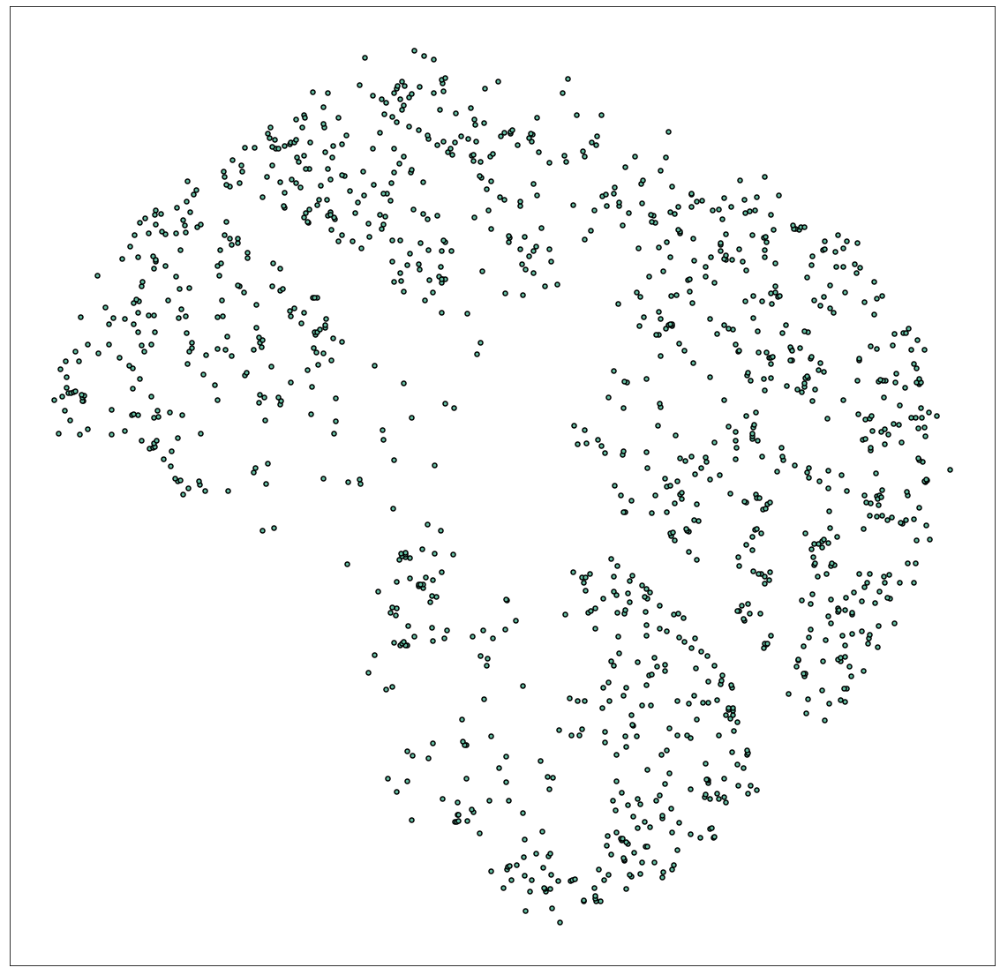

In [100]:
basic_graph(dividing_cells_graph,
                background_image = None,
                figsize = (20,20),
                alpha_line = 0.6,
                scatterpoint_size = 5,
                legend = False,
               color_lines = 'k',
               invert_axis = True)

#plt.savefig('graph_220407_1_2D_connections.pdf')

In [27]:
from skimage.measure import find_contours, approximate_polygon, subdivide_polygon

Number of coordinates: 22 704 26


NameError: name 'ellipse' is not defined

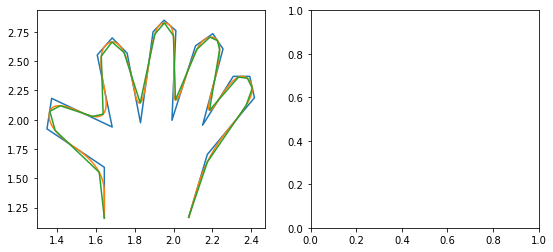

In [29]:
hand = np.array([[1.64516129, 1.16145833],
                 [1.64516129, 1.59375],
                 [1.35080645, 1.921875],
                 [1.375, 2.18229167],
                 [1.68548387, 1.9375],
                 [1.60887097, 2.55208333],
                 [1.68548387, 2.69791667],
                 [1.76209677, 2.56770833],
                 [1.83064516, 1.97395833],
                 [1.89516129, 2.75],
                 [1.9516129, 2.84895833],
                 [2.01209677, 2.76041667],
                 [1.99193548, 1.99479167],
                 [2.11290323, 2.63020833],
                 [2.2016129, 2.734375],
                 [2.25403226, 2.60416667],
                 [2.14919355, 1.953125],
                 [2.30645161, 2.36979167],
                 [2.39112903, 2.36979167],
                 [2.41532258, 2.1875],
                 [2.1733871, 1.703125],
                 [2.07782258, 1.16666667]])

# subdivide polygon using 2nd degree B-Splines
new_hand = hand.copy()
for _ in range(5):
    new_hand = subdivide_polygon(new_hand, degree=2, preserve_ends=True)

# approximate subdivided polygon with Douglas-Peucker algorithm
appr_hand = approximate_polygon(new_hand, tolerance=0.02)

print("Number of coordinates:", len(hand), len(new_hand), len(appr_hand))

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(9, 4))

ax1.plot(hand[:, 0], hand[:, 1])
ax1.plot(new_hand[:, 0], new_hand[:, 1])
ax1.plot(appr_hand[:, 0], appr_hand[:, 1])


# create two ellipses in image
img = np.zeros((800, 800), 'int32')
rr, cc = ellipse(250, 250, 180, 230, img.shape)
img[rr, cc] = 1
#rr, cc = ellipse(600, 600, 150, 90, img.shape)
#img[rr, cc] = 1

plt.gray()
ax2.imshow(img)

# approximate / simplify coordinates of the two ellipses
for contour in find_contours(img, 0):
    coords = approximate_polygon(contour, tolerance=2.5)
    ax2.plot(coords[:, 1], coords[:, 0], '-r', linewidth=2)
    coords2 = approximate_polygon(contour, tolerance=39.5)
    ax2.plot(coords2[:, 1], coords2[:, 0], '-g', linewidth=2)
    print("Number of coordinates:", len(contour), len(coords), len(coords2))

ax2.axis((0, 800, 0, 800))

plt.show()

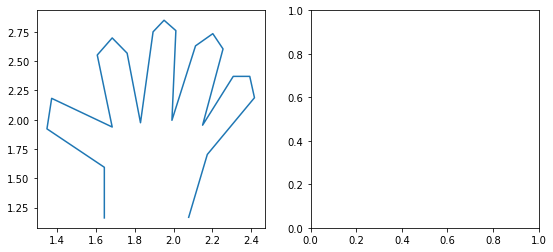

In [32]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(9, 4))
ax1.plot(hand[:, 0], hand[:, 1])
plt.show()

In [80]:
from mpl_toolkits.basemap import Basemap
import matplotlib.colors as mcolors

In [101]:
node_list = []
for x, y in G.nodes(data = True):
    if (y['cell_properties'] == 'CD45+, Kit+, DS-red-'):
        node_list.append(x)
        
dividing_cells_graph = G.subgraph(node_list)

In [102]:
X = nx.get_node_attributes(dividing_cells_graph, 'x')
x = np.array(list(X.values()))

Y = nx.get_node_attributes(dividing_cells_graph, 'y')
y = np.array(list(Y.values()))

density, _, _ = np.histogram2d(x,y,50)

In [103]:
normalize = mcolors.TwoSlopeNorm(vcenter=1, vmin=0, vmax=10)

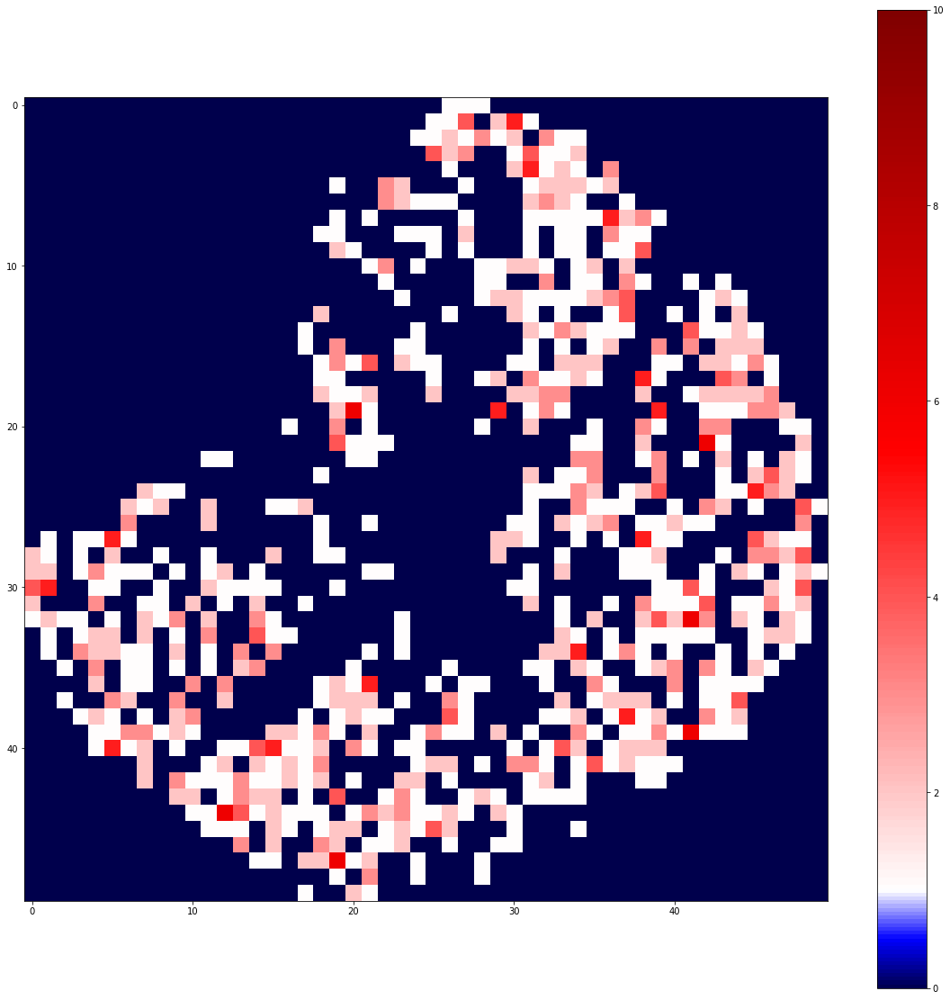

In [104]:
fig, ax = plt.subplots(figsize=(20, 20))
plt.imshow(density,cmap='seismic',norm=normalize)
plt.colorbar()
plt.show()